### AI Foundry Demo🚀

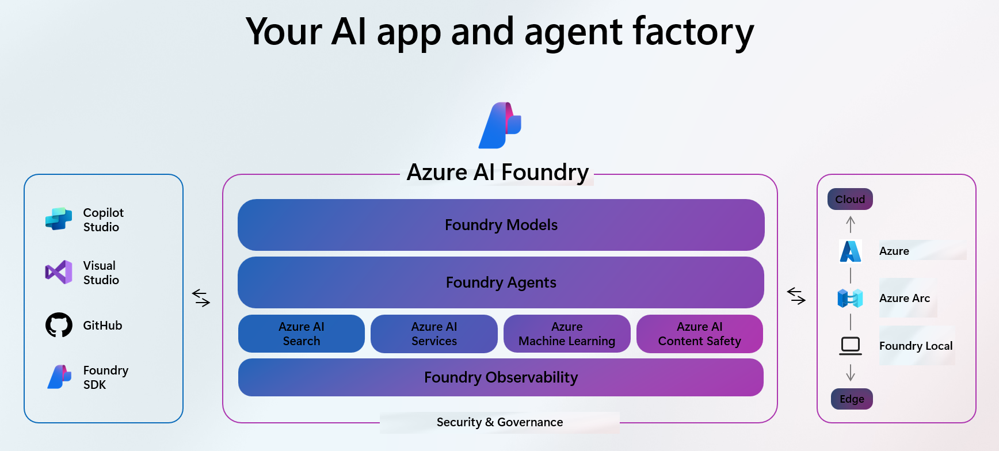

**Implement your own multi-agent workflow with AI Foundry**


Architecture Overview:

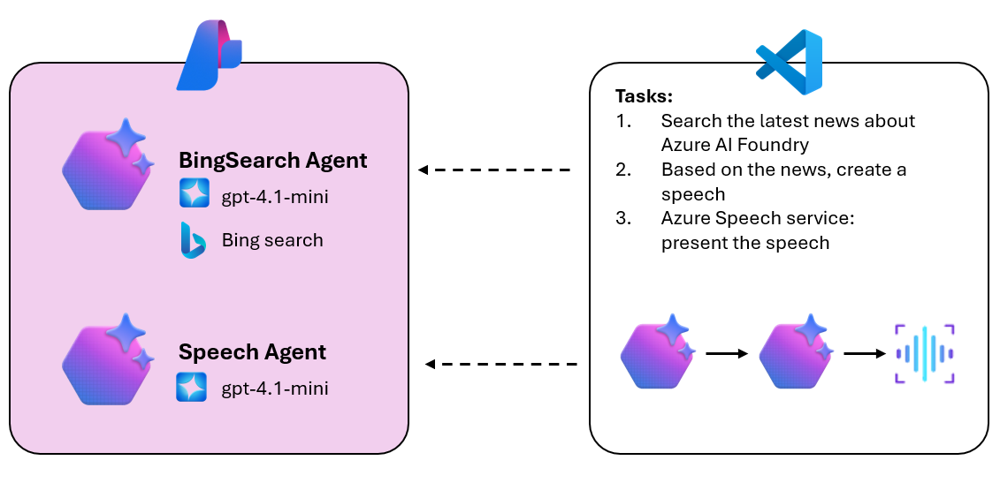

In [2]:
import os
from dotenv import load_dotenv
from azure.identity import DefaultAzureCredential
from azure.ai.projects import AIProjectClient
from azure.identity import DefaultAzureCredential
from azure.ai.projects import AIProjectClient


load_dotenv(dotenv_path=".env", override=True)

False

In [ ]:
credential = DefaultAzureCredential()

project_client = AIProjectClient(
    credential=credential,
    endpoint=os.environ["PROJECT_ENDPOINT"], #see AI foundry project endpoint
)
print("project_client api version:", project_client._config.api_version)

project_client api version: 2025-05-15-preview


In [6]:
#retrieve the bingsearchagent from AI foundry project
bingsearchagent = project_client.agents.get_agent("asst_DS6dGcFm5VMyZQdaJLeIirYH") 
speechagent = project_client.agents.get_agent("asst_VNenEnDk9WifbcosheMHdQrM")

In [7]:
import time

#1. Create a thread for the Bing Search Agent
thread = project_client.agents.threads.create()
print(f"Created thread, ID: {thread.id}")


project_client.agents.messages.create(
    thread_id=thread.id,
    role="user",
    content="What are the latest news about Azure AI Foundry?"
)


run = project_client.agents.runs.create(
    thread_id=thread.id,
    agent_id=bingsearchagent.id
)


while run.status in ["queued", "in_progress"]:
    time.sleep(1)
    run = project_client.agents.runs.get(thread_id=thread.id, run_id=run.id)


messages = list(project_client.agents.messages.list(thread_id=thread.id))
assistant_msgs = [m for m in messages if m["role"] == "assistant"]
latest_bing_response = assistant_msgs[-1]["content"][0]["text"]["value"]

print("\n📥 Bing Agent Response:")
print(latest_bing_response)

#----------------------------------------------------------------------------------------

#2. Create a thread for the Speech Agent and generate a speech based on the Bing response
speech_thread = project_client.agents.threads.create()


project_client.agents.messages.create(
    thread_id=speech_thread.id,
    role="user",
    content=f"Turn the news of Azure AI foundry into an engaging speech:\n\n{latest_bing_response}"
)


speech_run = project_client.agents.runs.create(
    thread_id=speech_thread.id,
    agent_id=speechagent.id
)


while speech_run.status in ["queued", "in_progress"]:
    time.sleep(1)
    speech_run = project_client.agents.runs.get(thread_id=speech_thread.id, run_id=speech_run.id)


speech_messages = list(project_client.agents.messages.list(thread_id=speech_thread.id))
assistant_speech = [m for m in speech_messages if m["role"] == "assistant"]
speech_output = assistant_speech[-1]["content"][0]["text"]["value"]


print("\n🎙️ Generated Speech:")
print(speech_output)


Created thread, ID: thread_g5aK3ke5Rk4FxBoFumeepDNN

📥 Bing Agent Response:
The latest updates about Azure AI Foundry in mid-2025 include several important developments:

1. Azure AI Foundry Agent Service is now Generally Available (GA) as of May 2025. New features include an agent catalog with prebuilt task-specific agents, a Visual Studio Code extension for agent deployment and configuration, connected agents to build multi-agent systems, trace agents for debugging, and triggering agents with Azure Logic Apps. There are also integrations with Bing Custom Search and Morningstar tools, Azure Monitor for metrics, and support for custom thread storage using Azure Cosmos DB【3:1†source】.

2. At Microsoft Build 2025, a broad range of Azure AI Foundry enhancements were announced. These include new AI models like Grok 3 from xAI, Flux Pro 1.1 from Black Forest Labs, and Sora on Azure OpenAI. Microsoft introduced Microsoft Discovery for enterprise agentic platforms and emphasized integration w

In [ ]:
!pip install openai azure-cognitiveservices-speech

In [8]:
import azure.cognitiveservices.speech as speechsdk

# Set up Azure Speech SDK
speech_key = "6sHgbBZ12NJv71GCm5QBL4jHgkQBP9WihwlcNpFaTITTx1fBBfQiJQQJ99BFACfhMk5XJ3w3AAAYACOGc9oa"
speech_region = "swedencentral"

speech_config = speechsdk.SpeechConfig(subscription=speech_key, region=speech_region)

speech_config.speech_synthesis_voice_name = "en-US-JennyNeural"


audio_config = speechsdk.audio.AudioOutputConfig(filename="news_speech.wav")


synthesizer = speechsdk.SpeechSynthesizer(speech_config=speech_config, audio_config=audio_config)


print("\n🎧 Generating audio from speech_output...")

result = synthesizer.speak_text_async(speech_output).get()

if result.reason == speechsdk.ResultReason.SynthesizingAudioCompleted:
    print("✅ Audio saved to 'news_speech.wav'")
else:
    print(f"❌ Speech synthesis failed: {result.reason}")



🎧 Generating audio from speech_output...
✅ Audio saved to 'news_speech.wav'


In [1]:
from IPython.display import Audio

Audio("news_speech.wav")
